# Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

In [ ]:
#identifying variables to work with for a marketing analysis


* **Study area**: Aberdeen City
* **Geography (spatial units**): 2011 Output Areas (OAs)
* **Dataset**: 2011 Scottish Census

**Subset of Scottish Census for Output Areas - OA geographies 2011**

* KS102SC - Age structure - Demographics
* KS103SC - Marital and civil partnership status - Demographics
* KS209SCb - Religion - Demographics
* QS104SC - Sex - Demographics
* QS501SC - Highest level of qualification - Education
* QS302SC - General Health - Health
* KS601SC - Economic activity - Economic 
* KS605SC - Industry - Economic

Patias, N., Rowe, F. and Arribas‐Bel, D., 2022. Trajectories of neighbourhood inequality in Britain: Unpacking inter‐regional socioeconomic imbalances, 1971− 2011. The Geographical Journal, 188(2), pp.150-165.

I chose to investigate Aberdeen City from a marketing perspective, since it is a highly unequal city (Ersoy, 2016) with diverse neighbourhoods that present potentially conflicting patterns of consumer behaviour.  The city's economic evolution, transitioning from traditional industries to a hub for oil and gas, has led to varied income levels across communities (Harris et al., 1986). This economic shift has influenced consumer behaviors and purchasing power, necessitating tailored marketing strategies. Additionally, the presence of the University of Aberdeen introduces a youthful demographic, contrasting with more established populations in other areas (Leiper and Hoot, 2023). Aberdeen's unique economic and demographic background makes it, in this case, an interesting site of study.

References:
Ersoy, A., 2016. The spread of coproduction: How the concept reached the northernmost city in the UK. Local Economy, 31(3), pp.410-423.
Harris, A.H., Lloyd, M.G., McGuire, A.J. and Newlands, D.A., 1986. Who gains from structural change? The distribution of the benefits of oil in Aberdeen. Urban Studies, 23(4), pp.271-283.
Illsley, R., 2002. A City's Schools: From equality of input to inequality of outcome. Oxford review of Education, 28(4), pp.427-445.
Leiper, A. and Hood, A., 2023, February. Noise and Deprivation in Scotland's Four Largest Cities: Glasgow, Edinburgh, Aberdeen and Dundee. In INTER-NOISE and NOISE-CON Congress and Conference Proceedings (Vol. 265, No. 5, pp. 2980-2989). Institute of Noise Control Engineering.
Williams, N.J., 1985. Crime patterns in Aberdeen. Scottish Geographical Magazine, 101(1), pp.49-60.


In [1]:
#preparing the data

In [2]:
#reading in selected raw census data (csv files)
import pandas as pd
import os

csv_directory = "data/aberdeen_data"

csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

# an empty DataFrame to store the merged data
merged_data = pd.DataFrame()

In [3]:
#merging the csv files
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file)
    df_csv = pd.read_csv(csv_path, low_memory=False)
    merged_data = pd.concat([merged_data, df_csv], axis=1)

merged_data.to_csv("data/aberdeen_data/merged_data.csv", index=False)

In [4]:
#checking out first few columns of merged variables
merged_data.head()

,oa_code,All people,0 to 4,5 to 7,8 to 9,10 to 14,15,16 to 17,18 to 19,20 to 24,...,Jewish,Muslim,Sikh,Other religion,No religion,Religion not stated,oa_code,All people,Males,Females
0,S92000003,"5,295,403","292,821","164,246","105,371","291,615","62,278","126,266","142,282","363,940",...,"5,887","76,737","9,055","15,196","1,941,116","368,039",S92000003,"5,295,403","2,567,444","2,727,959"
1,S00088956,230,28,22,6,13,2,4,6,10,...,-,-,-,-,87,11,S00088956,230,111,119
2,S00088957,66,2,1,1,4,-,3,2,4,...,-,3,-,-,21,1,S00088957,66,33,33
3,S00088958,90,3,8,7,12,-,2,3,2,...,-,11,-,-,33,5,S00088958,90,38,52
4,S00088959,83,8,7,3,2,-,1,1,4,...,-,-,-,-,46,10,S00088959,83,44,39


In [5]:
merged_data.columns

Index(['oa_code', 'All people', '0 to 4', '5 to 7', '8 to 9', '10 to 14', '15',
       '16 to 17', '18 to 19', '20 to 24',
       ...
       'Jewish', 'Muslim', 'Sikh', 'Other religion', 'No religion',
       'Religion not stated', 'oa_code', 'All people', 'Males', 'Females'],
      dtype='object', length=104)

In [6]:
#cleaning up the data

keep_cols= [
    'oa_code',
    'All people',
    '16 to 17',
    '18 to 19',
    '20 to 24',
    '25 to 29',
    '30 to 44',
    '45 to 59',
    '60 to 64',
    'Mean age',
    'Median age',
    'All people aged 16 to 74',
    'Economically active: Employee: Part-time',
    'Economically active: Employee: Full-time',
    'Economically active: Self-employed',
    'Unemployed people aged 16 to 74: Long-term unemployed',
    'Very good health',
    'Good health',
    'Fair health',
    'All people aged 16 and over',
    'All people aged 16 and over: Level 3',
    'All people aged 16 and over: Level 4 and above',
    'All people aged 16 to 74 in employment',
    'A. Agriculture forestry and fishing', 
    'B. Mining and quarrying',
    'F. Construction',
    'G. Wholesale and retail trade repair of motor vehicles and motorcycles',
    'H. Transport and storage',
    'J. Information and communication',
    'Males',
    'Females'
]

sorted_merged_data = merged_data[keep_cols]

In [7]:
# for more easy manipulation we define short column names
short_column_names = {
    'Economically active: Employee: Part-time': 'Econ_act_pt',
    'Economically active: Employee: Full-time': 'Econ_act_ft',
    'Economically active: Self-employed': 'Econ_act_se',
    'Very good health': 'Vgd_hlth',
    'Good health': 'Gd_hlth',
    'Fair health': 'Fr_hlth',
    'All people aged 16 and over: Level 3': 'Adult_Lvl3',
    'All people aged 16 and over: Level 4 and above': 'Adult_Lvl4',
    'A. Agriculture forestry and fishing': 'A_Agric', 
    'B. Mining and quarrying': 'B_Mining',
    'F. Construction': 'F_Construct',
    'G. Wholesale and retail trade repair of motor vehicles and motorcycles': 'G_Motor',
    'H. Transport and storage': 'H_Trans',
    'J. Information and communication': 'J_Info'
}

shortened_df = sorted_merged_data.rename(columns=short_column_names)

In [8]:
shortened_df.head()

,oa_code,oa_code,oa_code,oa_code,oa_code,oa_code,oa_code,oa_code,All people,All people,...,Adult_Lvl4,All people aged 16 to 74 in employment,A_Agric,B_Mining,F_Construct,G_Motor,H_Trans,J_Info,Males,Females
0,S92000003,S92000003,S92000003,S92000003,S92000003,S92000003,S92000003,S92000003,"5,295,403","5,295,403",...,"1,142,662",2516895,41902,33980,200343,376622,125111,69014,"2,567,444","2,727,959"
1,S00088956,S00088956,S00088956,S00088956,S00088956,S00088956,S00088956,S00088956,230,230,...,72,117,0,15,8,15,4,4,111,119
2,S00088957,S00088957,S00088957,S00088957,S00088957,S00088957,S00088957,S00088957,66,66,...,21,40,3,4,0,5,3,0,33,33
3,S00088958,S00088958,S00088958,S00088958,S00088958,S00088958,S00088958,S00088958,90,90,...,43,41,0,6,1,8,1,1,38,52
4,S00088959,S00088959,S00088959,S00088959,S00088959,S00088959,S00088959,S00088959,83,83,...,30,43,2,5,4,5,2,2,44,39


In [9]:
#removing any duplicates from this dataframe
merged_df = shortened_df.loc[:, ~shortened_df.columns.duplicated()]
merged_df.columns.tolist()
#saving this as a new dataframe
merged_df.to_csv("data/aberdeen_data/merged_df.csv", index=False)
merged_df.head()

,oa_code,All people,16 to 17,18 to 19,20 to 24,25 to 29,30 to 44,45 to 59,60 to 64,Mean age,...,Adult_Lvl4,All people aged 16 to 74 in employment,A_Agric,B_Mining,F_Construct,G_Motor,H_Trans,J_Info,Males,Females
0,S92000003,"5,295,403","126,266","142,282","363,940","345,632","1,056,449","1,117,647","336,522",40.3,...,"1,142,662",2516895,41902,33980,200343,376622,125111,69014,"2,567,444","2,727,959"
1,S00088956,230,4,6,10,12,67,38,5,30.8,...,72,117,0,15,8,15,4,4,111,119
2,S00088957,66,3,2,4,4,9,20,4,42.8,...,21,40,3,4,0,5,3,0,33,33
3,S00088958,90,2,3,2,1,19,26,1,32.2,...,43,41,0,6,1,8,1,1,38,52
4,S00088959,83,1,1,4,4,21,19,7,35.9,...,30,43,2,5,4,5,2,2,44,39


In [10]:
#merging the census data with the output area shapefile for Aberdeen's neighbourhoods
import pandas as pd
import geopandas as gpd

shp_path = "data/aberdeen_data/OutputArea2011_MHW.shp"
gdf = gpd.read_file(shp_path)
gdf.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,SHAPE_1_Le,SHAPE_1_Ar,DataZone,geometry
0,1,S00089001,55,115,S12000033,0.029184,2.918398,AB11 7XY,393374,805012,929.786180,29183.980141,S01006594,"POLYGON ((393393 805102, 393384 805051, 393441..."
1,2,S00090016,50,100,S12000033,0.017122,1.712225,AB16 7SX,389779,808556,745.621044,17122.247009,S01006720,"POLYGON ((389796 808485.001, 389817 808466, 38..."
2,3,S00089741,45,109,S12000033,0.045336,4.533582,AB15 4AH,391312,805970,1156.172057,45335.819961,S01006572,"POLYGON ((391410.771 806073.119, 391383.319 80..."
3,4,S00088978,33,60,S12000033,0.033488,3.348824,AB10 1SB,393473,806017,1173.627495,33488.237428,S01006585,"POLYGON ((393596.593 806042.095, 393651 806003..."
4,5,S00090442,64,97,S12000033,0.012945,1.294538,AB24 1TA,394564,808271,615.199658,12945.377768,S01006667,"POLYGON ((394659 808248, 394611.964 808248.964..."


In [11]:
#reducing the geodataframe to only include Aberdeen city's output areas
filtered_gdf = gdf[gdf['council'] == 'S12000033']
filtered_gdf.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,SHAPE_1_Le,SHAPE_1_Ar,DataZone,geometry
0,1,S00089001,55,115,S12000033,0.029184,2.918398,AB11 7XY,393374,805012,929.786180,29183.980141,S01006594,"POLYGON ((393393 805102, 393384 805051, 393441..."
1,2,S00090016,50,100,S12000033,0.017122,1.712225,AB16 7SX,389779,808556,745.621044,17122.247009,S01006720,"POLYGON ((389796 808485.001, 389817 808466, 38..."
2,3,S00089741,45,109,S12000033,0.045336,4.533582,AB15 4AH,391312,805970,1156.172057,45335.819961,S01006572,"POLYGON ((391410.771 806073.119, 391383.319 80..."
3,4,S00088978,33,60,S12000033,0.033488,3.348824,AB10 1SB,393473,806017,1173.627495,33488.237428,S01006585,"POLYGON ((393596.593 806042.095, 393651 806003..."
4,5,S00090442,64,97,S12000033,0.012945,1.294538,AB24 1TA,394564,808271,615.199658,12945.377768,S01006667,"POLYGON ((394659 808248, 394611.964 808248.964..."


In [12]:
#checking we have reduced the size of the geodataframe
#before filtering
gdf.shape

(46351, 14)

In [13]:
#after filtering
filtered_gdf.shape

(1992, 14)

In [14]:
filtered_gdf.to_file("data/aberdeen_data/gdf.shp", index=False)

In [15]:
#merging the census data with the output area shapefile for Aberdeen's 
gdf_path = "data/aberdeen_data/gdf.shp"
gdf = gpd.read_file(gdf_path, low_memory=False)

csv_path = "data/aberdeen_data/merged_df.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

# merging the GeoDataFrame with the DataFrame based on the oa_code
merged_data = gdf.merge(csv_data, left_on='code', right_on='oa_code', how='left')
#saving it as a shapefile
merged_data.to_file('data/aberdeen_data/aberdeen_data.shp', index=False)

C:\Users\user\MiniForge\Lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver ESRI Shapefile does not support open option LOW_MEMORY
  return ogr_read(
C:\Users\user\AppData\Local\Temp\ipykernel_12204\1681449206.py:11: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  merged_data.to_file('data/aberdeen_data/aberdeen_data.shp', index=False)
C:\Users\user\MiniForge\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'All people aged 16 to 74' to 'All peop_1'
  ogr_write(
C:\Users\user\MiniForge\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Econ_act_pt' to 'Econ_act_p'
  ogr_write(
C:\Users\user\MiniForge\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Econ_act_ft' to 'Econ_act_f'
  ogr_write(
C:\Users\user\MiniForge\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Econ_act_se'

In [16]:
merged_data.plot

In [17]:
merged_data.explore()

In [18]:
#running a DEA analysis

In [19]:
#examining full time workers in Aberdeen city
merged_data['Econ_act_ft'].describe()

count     1992
unique      98
top         38
freq        68
Name: Econ_act_ft, dtype: object

In [20]:
#examining part time workers in Aberdeen city
merged_data['Econ_act_pt'].describe()

count     1992
unique      34
top          6
freq       145
Name: Econ_act_pt, dtype: object

In [21]:
#examining citizens who work in agriculture, farming or fishing
merged_data.A_Agric.describe()

count    1992.000000
mean        0.144578
std         0.801293
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        27.000000
Name: A_Agric, dtype: float64

In [22]:
#examining citizens who work in the mining industry
merged_data.B_Mining.describe()

count    1992.000000
mean        5.378514
std         4.434727
min         0.000000
25%         2.000000
50%         4.000000
75%         7.000000
max        32.000000
Name: B_Mining, dtype: float64

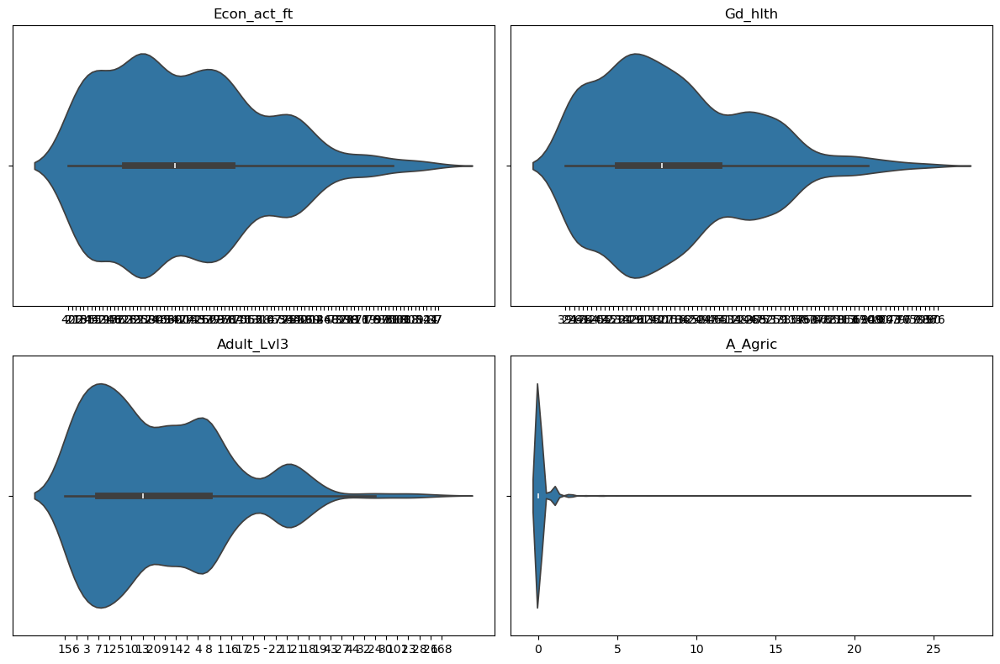

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['Econ_act_ft',
                      'Gd_hlth',
                      'Adult_Lvl3',
                      'A_Agric']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.violinplot(x=merged_data[attribute])
    plt.title(attribute)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

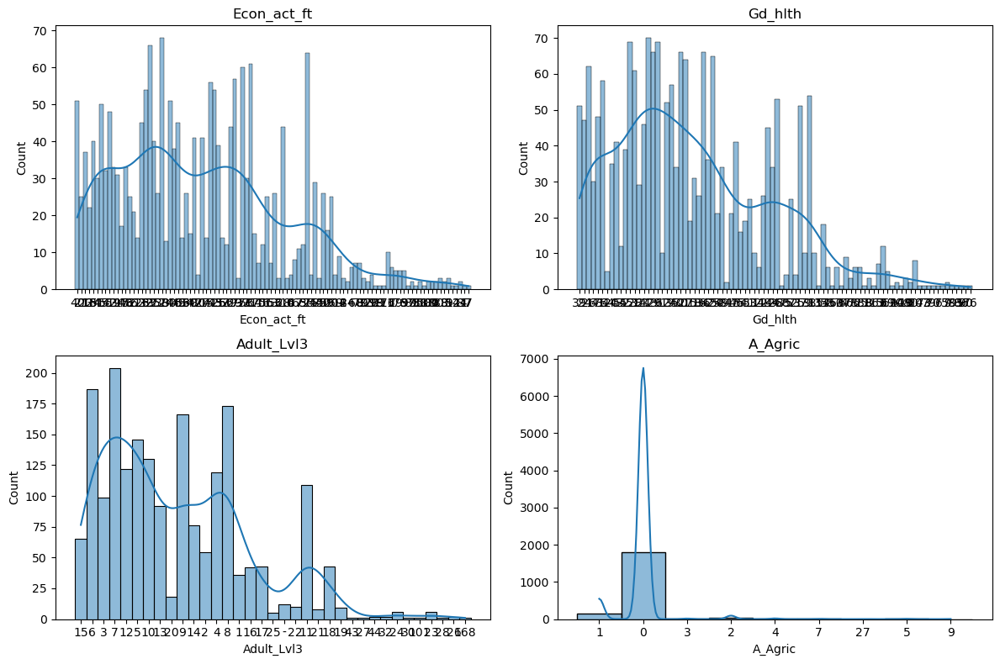

In [24]:
import matplotlib.pyplot as plt

attributes_to_plot = ['Econ_act_ft',
                      'Gd_hlth',
                      'Adult_Lvl3',
                      'A_Agric']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

In [25]:
#subsetting the data

In [26]:
#we have already outlined our total columns and value columns
def calculate_percentages(dataframe, total_columns, value_columns):
    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")

        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')

        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

        result_df[percentage_col_name] = result_df[percentage_col_name].replace([float('inf'), -float('inf')], 0).fillna(0)

    return dataframe.join(result_df)

#list of all the corresponding totals
total_cols = ['All people',
              'All people',
              'All people',
              'All people',
              'All people',
              'All people',
              'All people',
              'All people',
              'All people aged 16 to 74',
              'All people aged 16 to 74',
              'All people aged 16 to 74',
              'All people aged 16 to 74',
              'All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment'
]

#list of the corresponding values. 
value_cols = ['16 to 17',
              '18 to 19',
              '20 to 24',
              '25 to 29',
              '30 to 44',
              '45 to 59',
              '60 to 64',
              'Gd_hlth',
              'Econ_act_pt',
              'Econ_act_ft',
              'Econ_act_se',
              'Unemployed people aged 16 to 74: Long-term unemployed',
              'A_Agric',
              'B_Mining',
              'F_Construct',
              'G_Motor',
              'H_Trans',
              'J_Info'
]

result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)

In [27]:
result_dataframe.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,Econ_act_pt_percentage,Econ_act_ft_percentage,Econ_act_se_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
0,1,S00089001,55,115,S12000033,0.029184,2.918398,AB11 7XY,393374,805012,...,13.186813,43.956044,5.494505,0.000000,1.694915,18.644068,6.779661,11.864407,5.084746,1.694915
1,2,S00090016,50,100,S12000033,0.017122,1.712225,AB16 7SX,389779,808556,...,14.666667,53.333333,1.333333,1.333333,0.000000,3.636364,7.272727,16.363636,16.363636,3.636364
2,3,S00089741,45,109,S12000033,0.045336,4.533582,AB15 4AH,391312,805970,...,16.216216,28.378378,9.459459,1.351351,0.000000,29.268293,2.439024,2.439024,7.317073,2.439024
3,4,S00088978,33,60,S12000033,0.033488,3.348824,AB10 1SB,393473,806017,...,5.555556,42.592593,5.555556,1.851852,0.000000,14.285714,5.714286,11.428571,0.000000,2.857143
4,5,S00090442,64,97,S12000033,0.012945,1.294538,AB24 1TA,394564,808271,...,9.876543,22.222222,3.703704,1.234568,0.000000,2.941176,5.882353,17.647059,8.823529,0.000000


In [28]:
result_dataframe.shape

(1992, 63)

In [29]:
#before concatenating, I will renamae one of the geometry columns since duplication complicates this operation
result_dataframe = result_dataframe.rename(columns={'geometry': 'geometry_alt'})
concatenated_df = pd.concat([merged_data, result_dataframe], axis=1)

In [30]:
concatenated_df.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,Econ_act_pt_percentage,Econ_act_ft_percentage,Econ_act_se_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
0,1,S00089001,55,115,S12000033,0.029184,2.918398,AB11 7XY,393374,805012,...,13.186813,43.956044,5.494505,0.000000,1.694915,18.644068,6.779661,11.864407,5.084746,1.694915
1,2,S00090016,50,100,S12000033,0.017122,1.712225,AB16 7SX,389779,808556,...,14.666667,53.333333,1.333333,1.333333,0.000000,3.636364,7.272727,16.363636,16.363636,3.636364
2,3,S00089741,45,109,S12000033,0.045336,4.533582,AB15 4AH,391312,805970,...,16.216216,28.378378,9.459459,1.351351,0.000000,29.268293,2.439024,2.439024,7.317073,2.439024
3,4,S00088978,33,60,S12000033,0.033488,3.348824,AB10 1SB,393473,806017,...,5.555556,42.592593,5.555556,1.851852,0.000000,14.285714,5.714286,11.428571,0.000000,2.857143
4,5,S00090442,64,97,S12000033,0.012945,1.294538,AB24 1TA,394564,808271,...,9.876543,22.222222,3.703704,1.234568,0.000000,2.941176,5.882353,17.647059,8.823529,0.000000


In [31]:
concatenated_df.shape

(1992, 108)

In [32]:
list(concatenated_df.columns)

['OBJECTID',
 'code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'SHAPE_1_Le',
 'SHAPE_1_Ar',
 'DataZone',
 'geometry',
 'oa_code',
 'All people',
 '16 to 17',
 '18 to 19',
 '20 to 24',
 '25 to 29',
 '30 to 44',
 '45 to 59',
 '60 to 64',
 'Mean age',
 'Median age',
 'All people aged 16 to 74',
 'Econ_act_pt',
 'Econ_act_ft',
 'Econ_act_se',
 'Unemployed people aged 16 to 74: Long-term unemployed',
 'Vgd_hlth',
 'Gd_hlth',
 'Fr_hlth',
 'All people aged 16 and over',
 'Adult_Lvl3',
 'Adult_Lvl4',
 'All people aged 16 to 74 in employment',
 'A_Agric',
 'B_Mining',
 'F_Construct',
 'G_Motor',
 'H_Trans',
 'J_Info',
 'Males',
 'Females',
 'OBJECTID',
 'code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'SHAPE_1_Le',
 'SHAPE_1_Ar',
 'DataZone',
 'geometry_alt',
 'oa_code',
 'All people',
 '16 to 17',
 '18 to 19',
 '20 to 24',
 '25 to 29',
 '30 to 44',
 '45 to 59',
 '60 to 64',
 'Mean age',
 '

In [33]:
#reducing number of columns once again before proceeding with further analysis
keep_cols= [
    'code',
    'Popcount',
    'council',
    'DataZone',
    'geometry',
    '16 to 17_percentage',
    '18 to 19_percentage',
    '20 to 24_percentage',
    '25 to 29_percentage',
    '30 to 44_percentage',
    '45 to 59_percentage',
    '60 to 64_percentage',
    'Gd_hlth_percentage',
    'Econ_act_pt_percentage',
    'Econ_act_ft_percentage',
    'Unemployed people aged 16 to 74: Long-term unemployed_percentage',
    'A_Agric_percentage',
    'B_Mining_percentage',
    'F_Construct_percentage',
    'G_Motor_percentage',
    'H_Trans_percentage',
    'J_Info_percentage'
]
merged_data = concatenated_df[keep_cols]

In [34]:
#standardising our variables through inverse hyperbolic sine standardisation
import numpy as np

def inverse_hyperbolic_sine_standardisation(x):
    x = pd.to_numeric(x, errors='coerce')  # Convert to number, set non-numeric to NaN
    return np.arcsinh(x) if np.isscalar(x) or x.notna().all() else np.nan 

validated_df_ihs = merged_data.apply(inverse_hyperbolic_sine_standardisation)
validated_df_ihs.head()

code                                                      NaN
code                                                      NaN
Popcount    0       5.438098
1       5.298342
2       5.38...
Popcount    0       5.438098
1       5.298342
2       5.38...
council                                                   NaN
dtype: object

In [36]:
merged_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1992 entries, 0 to 1991
Data columns (total 26 columns):
 #   Column                                                            Non-Null Count  Dtype   
---  ------                                                            --------------  -----   
 0   code                                                              1992 non-null   object  
 1   code                                                              1992 non-null   object  
 2   Popcount                                                          1992 non-null   int32   
 3   Popcount                                                          1992 non-null   int32   
 4   council                                                           1992 non-null   object  
 5   council                                                           1992 non-null   object  
 6   DataZone                                                          1992 non-null   object  
 7   DataZone        

In [37]:
#calculating z-scores for each column
numeric_columns = merged_data.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

,16 to 17_percentage,18 to 19_percentage,20 to 24_percentage,25 to 29_percentage,30 to 44_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Econ_act_ft_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
0,-0.061327,0.225357,-0.630977,-0.723583,-0.280428,0.226371,1.440193,0.324139,0.250514,-0.187790,-0.717170,1.457447,1.665051,0.164388,-0.457399,-0.151447,-0.269496
1,0.662250,-0.502513,-0.985043,-0.265553,-0.036158,0.501719,0.339135,-1.069023,0.530901,0.584860,0.149142,-0.227694,-0.814998,0.282821,0.182780,2.453411,0.545948
2,1.573073,-0.257313,-0.896748,-1.038742,-1.341520,0.730565,-0.278073,-1.089653,0.824493,-1.471326,0.160849,-0.227694,3.420723,-0.878220,-1.798503,0.364109,0.043044
3,-1.059364,0.182791,2.610797,0.194295,-0.166814,-1.178463,0.253868,-0.460024,-1.195378,-0.300133,0.486041,-0.227694,0.944826,-0.091512,-0.519413,-1.325768,0.218661
4,-1.059364,-0.493430,-0.109525,0.670521,-0.085996,-0.738764,1.185653,1.498336,-0.376682,-1.978568,0.084971,-0.227694,-0.929878,-0.051143,0.365394,0.712025,-0.981391


In [38]:
z_score_df.shape

(1992, 17)

In [39]:
corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,16 to 17_percentage,18 to 19_percentage,20 to 24_percentage,25 to 29_percentage,30 to 44_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Econ_act_ft_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
16 to 17_percentage,1.000000,0.006004,-0.315701,-0.383894,-0.109709,0.369335,0.078123,-0.039161,0.328182,-0.126212,0.003847,0.053219,0.031308,0.081073,-0.028995,0.025686,-0.080758
18 to 19_percentage,0.006004,1.000000,0.363249,0.090223,-0.112157,-0.193054,-0.202758,-0.030190,-0.170925,-0.225341,0.007625,0.022851,-0.122526,-0.105934,0.237650,-0.088837,0.011890
20 to 24_percentage,-0.315701,0.363249,1.000000,0.591947,0.111127,-0.511999,-0.437137,-0.097820,-0.487728,0.055706,-0.010640,-0.041496,-0.082849,-0.239293,0.220274,-0.206870,0.120214
25 to 29_percentage,-0.383894,0.090223,0.591947,1.000000,0.397039,-0.515171,-0.481086,-0.071331,-0.480987,0.468855,0.048697,-0.063622,0.058437,-0.190276,0.052857,-0.160614,0.139797
30 to 44_percentage,-0.109709,-0.112157,0.111127,0.397039,1.000000,-0.231595,-0.444279,-0.089294,-0.114620,0.603993,0.088796,-0.034284,0.178360,-0.070904,-0.121745,-0.109878,0.115353
45 to 59_percentage,0.369335,-0.193054,-0.511999,-0.515171,-0.231595,1.000000,0.349645,0.104017,0.432186,0.059840,-0.026723,0.049924,0.082531,0.188593,-0.132532,0.134672,-0.055445
60 to 64_percentage,0.078123,-0.202758,-0.437137,-0.481086,-0.444279,0.349645,1.000000,0.189189,0.263977,-0.238893,-0.104676,0.033812,-0.051753,0.157858,-0.050363,0.146023,-0.065377
Gd_hlth_percentage,-0.039161,-0.030190,-0.097820,-0.071331,-0.089294,0.104017,0.189189,1.000000,0.165118,-0.037595,0.136940,-0.024320,-0.300137,0.185045,0.145651,0.231836,-0.102151
Econ_act_pt_percentage,0.328182,-0.170925,-0.487728,-0.480987,-0.114620,0.432186,0.263977,0.165118,1.000000,-0.173173,0.044625,-0.003724,-0.186102,0.235102,0.022940,0.223423,-0.170623
Econ_act_ft_percentage,-0.126212,-0.225341,0.055706,0.468855,0.603993,0.059840,-0.238893,-0.037595,-0.173173,1.000000,-0.139128,-0.037717,0.303400,-0.029895,-0.197487,-0.045950,0.139332


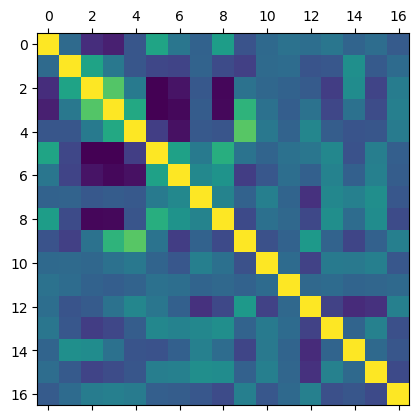

In [40]:
import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()

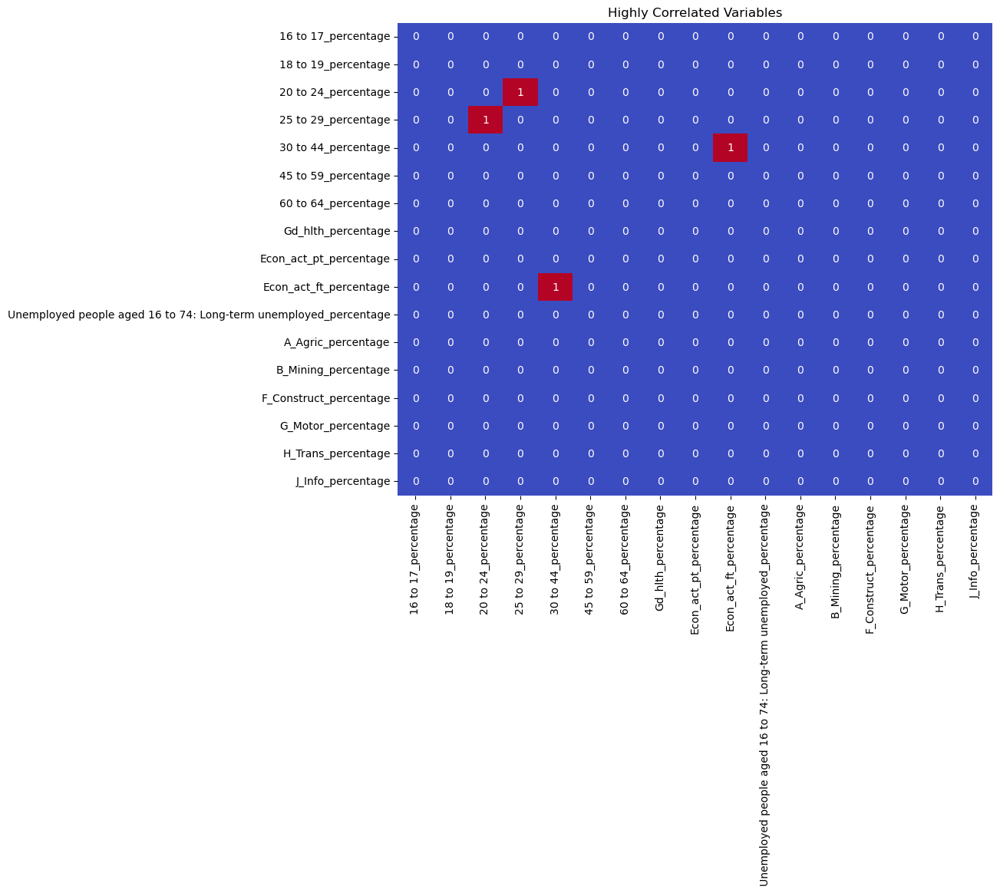

In [41]:
#seeing which variables are highly correlated - setting our threshold to above 55%
threshold = 0.55
highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

In [42]:
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1992 entries, 0 to 1991
Data columns (total 17 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   16 to 17_percentage                                               1992 non-null   float64
 1   18 to 19_percentage                                               1992 non-null   float64
 2   20 to 24_percentage                                               1992 non-null   float64
 3   25 to 29_percentage                                               1992 non-null   float64
 4   30 to 44_percentage                                               1992 non-null   float64
 5   45 to 59_percentage                                               1992 non-null   float64
 6   60 to 64_percentage                                               1992 non-null   float64
 7   Gd_hlth_percentage               

We can clearly see that we need to remove the variables ages 20 to 24, 25 to 29, 30-44, economically active and in full time employment, as they are above our set correlation threshold.

In [43]:
z_score_df.drop(['20 to 24_percentage', '25 to 29_percentage', '30 to 44_percentage', 'Econ_act_ft_percentage'], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1992 entries, 0 to 1991
Data columns (total 13 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   16 to 17_percentage                                               1992 non-null   float64
 1   18 to 19_percentage                                               1992 non-null   float64
 2   45 to 59_percentage                                               1992 non-null   float64
 3   60 to 64_percentage                                               1992 non-null   float64
 4   Gd_hlth_percentage                                                1992 non-null   float64
 5   Econ_act_pt_percentage                                            1992 non-null   float64
 6   Unemployed people aged 16 to 74: Long-term unemployed_percentage  1992 non-null   float64
 7   A_Agric_percentage               

In [44]:
#looking at our correlations once again
corr_2 = z_score_df.corr()
corr_2.style.background_gradient(cmap='coolwarm')

,16 to 17_percentage,18 to 19_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
16 to 17_percentage,1.000000,0.006004,0.369335,0.078123,-0.039161,0.328182,0.003847,0.053219,0.031308,0.081073,-0.028995,0.025686,-0.080758
18 to 19_percentage,0.006004,1.000000,-0.193054,-0.202758,-0.030190,-0.170925,0.007625,0.022851,-0.122526,-0.105934,0.237650,-0.088837,0.011890
45 to 59_percentage,0.369335,-0.193054,1.000000,0.349645,0.104017,0.432186,-0.026723,0.049924,0.082531,0.188593,-0.132532,0.134672,-0.055445
60 to 64_percentage,0.078123,-0.202758,0.349645,1.000000,0.189189,0.263977,-0.104676,0.033812,-0.051753,0.157858,-0.050363,0.146023,-0.065377
Gd_hlth_percentage,-0.039161,-0.030190,0.104017,0.189189,1.000000,0.165118,0.136940,-0.024320,-0.300137,0.185045,0.145651,0.231836,-0.102151
Econ_act_pt_percentage,0.328182,-0.170925,0.432186,0.263977,0.165118,1.000000,0.044625,-0.003724,-0.186102,0.235102,0.022940,0.223423,-0.170623
Unemployed people aged 16 to 74: Long-term unemployed_percentage,0.003847,0.007625,-0.026723,-0.104676,0.136940,0.044625,1.000000,0.013090,-0.219158,0.108291,0.095965,0.136997,-0.101457
A_Agric_percentage,0.053219,0.022851,0.049924,0.033812,-0.024320,-0.003724,0.013090,1.000000,-0.003117,0.014544,-0.028306,-0.014951,0.001215
B_Mining_percentage,0.031308,-0.122526,0.082531,-0.051753,-0.300137,-0.186102,-0.219158,-0.003117,1.000000,-0.217647,-0.330403,-0.299383,0.145232
F_Construct_percentage,0.081073,-0.105934,0.188593,0.157858,0.185045,0.235102,0.108291,0.014544,-0.217647,1.000000,-0.026238,0.152093,-0.145389


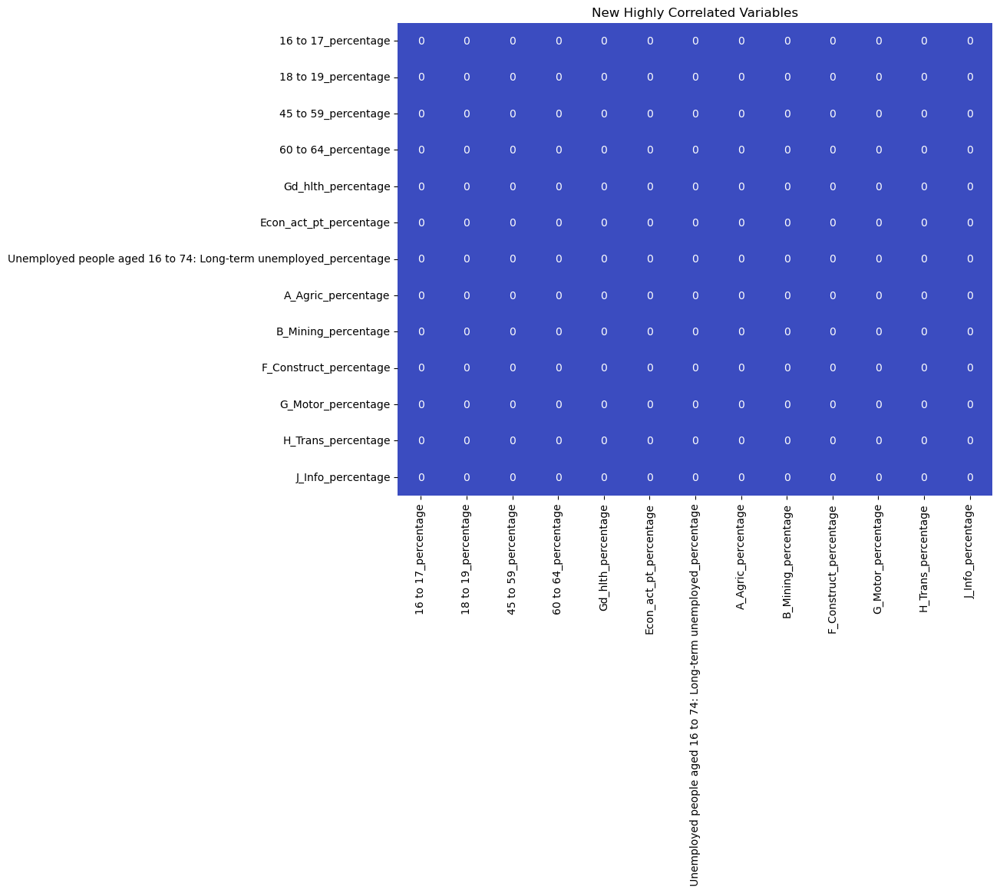

In [45]:
threshold = 0.7
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

In [47]:
#getting rid of NaN values
#in our dataset, does not apply or NA options are labelled as such
z_score_df.replace(['NA', 'Does not apply'], pd.NA, inplace=True)
contains_nan = z_score_df.isna().any().any()

if contains_nan:
    print("The DataFrame contains NaN values.")
else:
    print("The dataFrame does not contain NaN values.")

The dataFrame does not contain NaN values.


In [48]:
z_score_df.fillna(z_score_df.mean(), inplace=True)

In [49]:
z_score_df.head()

,16 to 17_percentage,18 to 19_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage
0,-0.061327,0.225357,0.226371,1.440193,0.324139,0.250514,-0.717170,1.457447,1.665051,0.164388,-0.457399,-0.151447,-0.269496
1,0.662250,-0.502513,0.501719,0.339135,-1.069023,0.530901,0.149142,-0.227694,-0.814998,0.282821,0.182780,2.453411,0.545948
2,1.573073,-0.257313,0.730565,-0.278073,-1.089653,0.824493,0.160849,-0.227694,3.420723,-0.878220,-1.798503,0.364109,0.043044
3,-1.059364,0.182791,-1.178463,0.253868,-0.460024,-1.195378,0.486041,-0.227694,0.944826,-0.091512,-0.519413,-1.325768,0.218661
4,-1.059364,-0.493430,-0.738764,1.185653,1.498336,-0.376682,0.084971,-0.227694,-0.929878,-0.051143,0.365394,0.712025,-0.981391


In [50]:
z_score_df.shape

(1992, 13)

In [51]:
#using K-means clustering
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

In [52]:
z_score_df.head()

,16 to 17_percentage,18 to 19_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage,Cluster
0,-0.061327,0.225357,0.226371,1.440193,0.324139,0.250514,-0.717170,1.457447,1.665051,0.164388,-0.457399,-0.151447,-0.269496,5
1,0.662250,-0.502513,0.501719,0.339135,-1.069023,0.530901,0.149142,-0.227694,-0.814998,0.282821,0.182780,2.453411,0.545948,0
2,1.573073,-0.257313,0.730565,-0.278073,-1.089653,0.824493,0.160849,-0.227694,3.420723,-0.878220,-1.798503,0.364109,0.043044,2
3,-1.059364,0.182791,-1.178463,0.253868,-0.460024,-1.195378,0.486041,-0.227694,0.944826,-0.091512,-0.519413,-1.325768,0.218661,9
4,-1.059364,-0.493430,-0.738764,1.185653,1.498336,-0.376682,0.084971,-0.227694,-0.929878,-0.051143,0.365394,0.712025,-0.981391,0


(array([203., 298., 346., 203.,  20., 235., 168., 279.,  11., 229.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

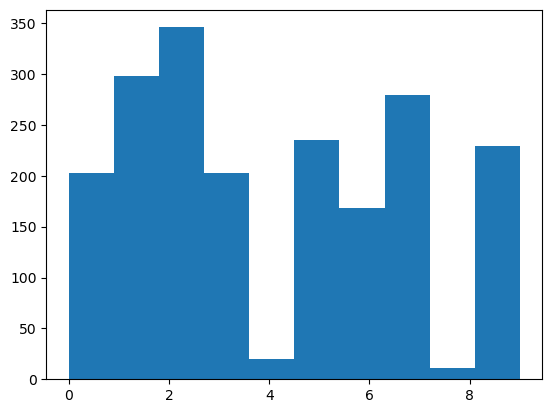

In [53]:
plt.hist(labels)

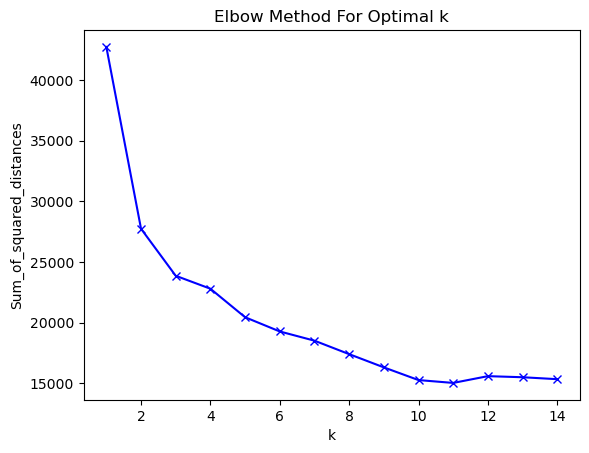

In [54]:
Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

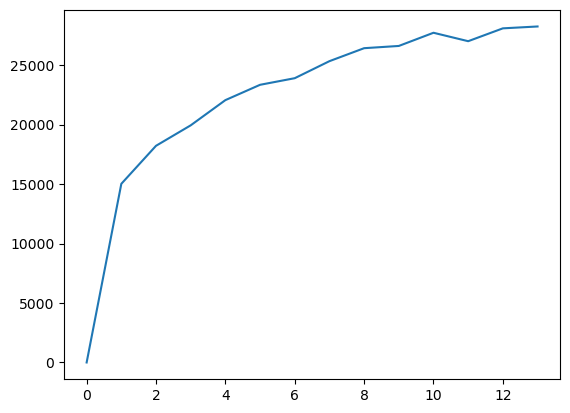

In [55]:
import numpy as np
def elbow(dataframe, n):
    kMeansVar = [KMeans(n_clusters=k).fit(dataframe.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(dataframe.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(dataframe.values)**2)/dataframe.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_df,15)

In [56]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

In [57]:
z_score_df.head()

,16 to 17_percentage,18 to 19_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage,Cluster
0,-0.061327,0.225357,0.226371,1.440193,0.324139,0.250514,-0.717170,1.457447,1.665051,0.164388,-0.457399,-0.151447,-0.269496,2
1,0.662250,-0.502513,0.501719,0.339135,-1.069023,0.530901,0.149142,-0.227694,-0.814998,0.282821,0.182780,2.453411,0.545948,0
2,1.573073,-0.257313,0.730565,-0.278073,-1.089653,0.824493,0.160849,-0.227694,3.420723,-0.878220,-1.798503,0.364109,0.043044,4
3,-1.059364,0.182791,-1.178463,0.253868,-0.460024,-1.195378,0.486041,-0.227694,0.944826,-0.091512,-0.519413,-1.325768,0.218661,1
4,-1.059364,-0.493430,-0.738764,1.185653,1.498336,-0.376682,0.084971,-0.227694,-0.929878,-0.051143,0.365394,0.712025,-0.981391,0


In [58]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysys.
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_
# creating a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")


These two components explain 32.90% of the point variability.


<Figure size 1200x800 with 0 Axes>

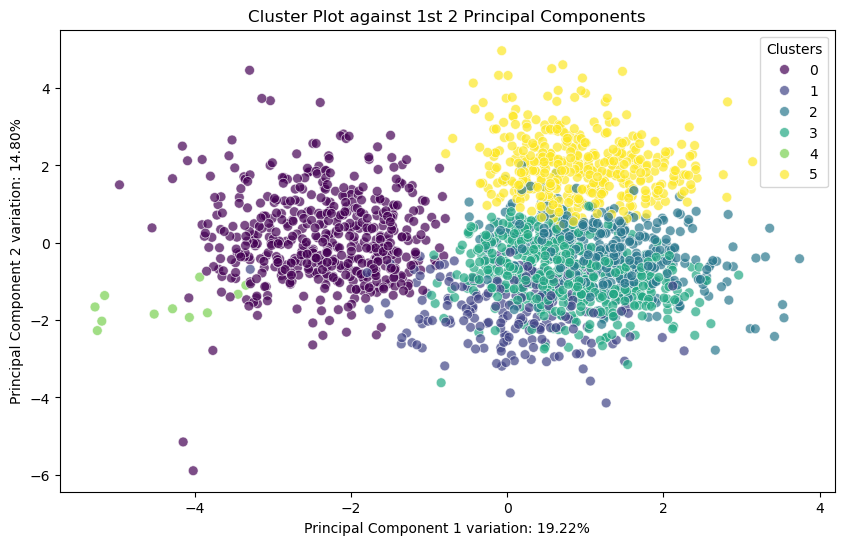

In [59]:
kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

In [60]:
# KMeans clustering
kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

# Get the cluster centers
cluster_centers = kmeans.cluster_centers_


# Get the cluster centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

# Create a new DataFrame with cluster assignments and column names
#result_df = pd.DataFrame({'Cluster': clusters, 'Column': z_score_df.columns})

cluster_centers.head(6)

,16 to 17_percentage,18 to 19_percentage,45 to 59_percentage,60 to 64_percentage,Gd_hlth_percentage,Econ_act_pt_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage,Cluster
0,0.665428,-0.161765,0.740981,0.050191,-0.725109,0.193638,-0.364970,-0.044848,0.840012,-0.302042,-0.562884,-0.510934,0.228206,5.000000
1,0.240669,0.040211,-0.064228,-0.329835,0.401197,0.226900,2.172331,-0.050949,-0.609323,0.367724,0.296783,0.329754,-0.316161,1.010000
2,-0.690528,0.353934,-1.009248,-0.702883,-0.397414,-1.041693,-0.216780,-0.102798,0.295090,-0.592809,0.114784,-0.543077,0.424345,0.084942
3,0.425559,-0.024290,0.561078,0.438052,-0.648806,-0.168411,-0.075162,7.321038,0.105313,-0.000920,-0.272752,-0.164711,-0.103467,4.800000
4,-0.162062,-0.116401,0.017680,-0.081720,0.392125,0.443958,-0.113821,-0.080337,-0.585439,0.365698,0.190842,0.698485,-0.477325,2.943137
5,0.352568,-0.193159,0.640160,1.245794,0.617853,0.550661,-0.339926,-0.069125,-0.169801,0.461335,0.021658,0.170427,0.001075,2.064607


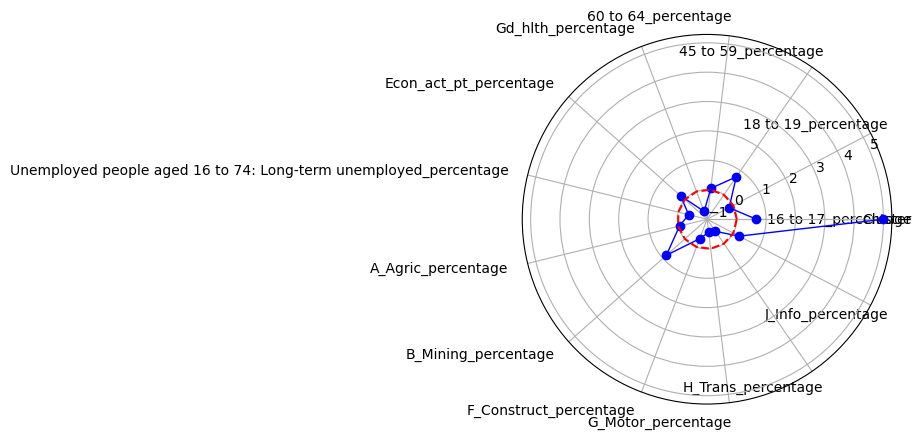

In [61]:
first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

In [62]:
#mapping the clusters
list(z_score_df.columns)

['16 to 17_percentage',
 '18 to 19_percentage',
 '45 to 59_percentage',
 '60 to 64_percentage',
 'Gd_hlth_percentage',
 'Econ_act_pt_percentage',
 'Unemployed people aged 16 to 74: Long-term unemployed_percentage',
 'A_Agric_percentage',
 'B_Mining_percentage',
 'F_Construct_percentage',
 'G_Motor_percentage',
 'H_Trans_percentage',
 'J_Info_percentage',
 'Cluster']

In [64]:
z_score_df.drop([
 '16 to 17_percentage',
 '18 to 19_percentage',
 '45 to 59_percentage',
 '60 to 64_percentage',
 'Gd_hlth_percentage',
 'Econ_act_pt_percentage',
 'Unemployed people aged 16 to 74: Long-term unemployed_percentage',
 'A_Agric_percentage',
 'B_Mining_percentage',
 'F_Construct_percentage',
 'G_Motor_percentage',
 'H_Trans_percentage',
 'J_Info_percentage'], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1992 entries, 0 to 1991
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Cluster  1992 non-null   int32
dtypes: int32(1)
memory usage: 7.9 KB


In [67]:
# Concatenate the resulting tables.
final_df = pd.concat([merged_data, z_score_df], axis=1, ignore_index=False)
final_df.head()

,code,code,Popcount,Popcount,council,council,DataZone,DataZone,geometry,16 to 17_percentage,...,Econ_act_pt_percentage,Econ_act_ft_percentage,Unemployed people aged 16 to 74: Long-term unemployed_percentage,A_Agric_percentage,B_Mining_percentage,F_Construct_percentage,G_Motor_percentage,H_Trans_percentage,J_Info_percentage,Cluster
0,S00089001,S00089001,115,115,S12000033,S12000033,S01006594,S01006594,"POLYGON ((393393 805102, 393384 805051, 393441...",1.739130,...,13.186813,43.956044,0.000000,1.694915,18.644068,6.779661,11.864407,5.084746,1.694915,2
1,S00090016,S00090016,100,100,S12000033,S12000033,S01006720,S01006720,"POLYGON ((389796 808485.001, 389817 808466, 38...",3.000000,...,14.666667,53.333333,1.333333,0.000000,3.636364,7.272727,16.363636,16.363636,3.636364,3
2,S00089741,S00089741,109,109,S12000033,S12000033,S01006572,S01006572,"POLYGON ((391410.771 806073.119, 391383.319 80...",4.587156,...,16.216216,28.378378,1.351351,0.000000,29.268293,2.439024,2.439024,7.317073,2.439024,5
3,S00088978,S00088978,60,60,S12000033,S12000033,S01006585,S01006585,"POLYGON ((393596.593 806042.095, 393651 806003...",0.000000,...,5.555556,42.592593,1.851852,0.000000,14.285714,5.714286,11.428571,0.000000,2.857143,0
4,S00090442,S00090442,97,97,S12000033,S12000033,S01006667,S01006667,"POLYGON ((394659 808248, 394611.964 808248.964...",0.000000,...,9.876543,22.222222,1.234568,0.000000,2.941176,5.882353,17.647059,8.823529,0.000000,3


In [75]:
final_df.columns

Index(['code', 'code', 'Popcount', 'Popcount', 'council', 'council',
       'DataZone', 'DataZone', 'geometry', '16 to 17_percentage',
       '18 to 19_percentage', '20 to 24_percentage', '25 to 29_percentage',
       '30 to 44_percentage', '45 to 59_percentage', '60 to 64_percentage',
       'Gd_hlth_percentage', 'Econ_act_pt_percentage',
       'Econ_act_ft_percentage',
       'Unemployed people aged 16 to 74: Long-term unemployed_percentage',
       'A_Agric_percentage', 'B_Mining_percentage', 'F_Construct_percentage',
       'G_Motor_percentage', 'H_Trans_percentage', 'J_Info_percentage',
       'Cluster'],
      dtype='object')

In [76]:
# if there are any duplicates at this point you can drop them using the following code, if not just skip to exploring 
final_df = final_df.loc[:, ~final_df.columns.duplicated()]

In [77]:
final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')
